In [1]:
from pathlib import Path

In [2]:
data_path = Path('data')
print(list(data_path.glob('*')))

[PosixPath('data/7800049300_20210324_160301_0032.jpg')]


In [3]:
from PIL import Image, ImageDraw
from IPython.display import display

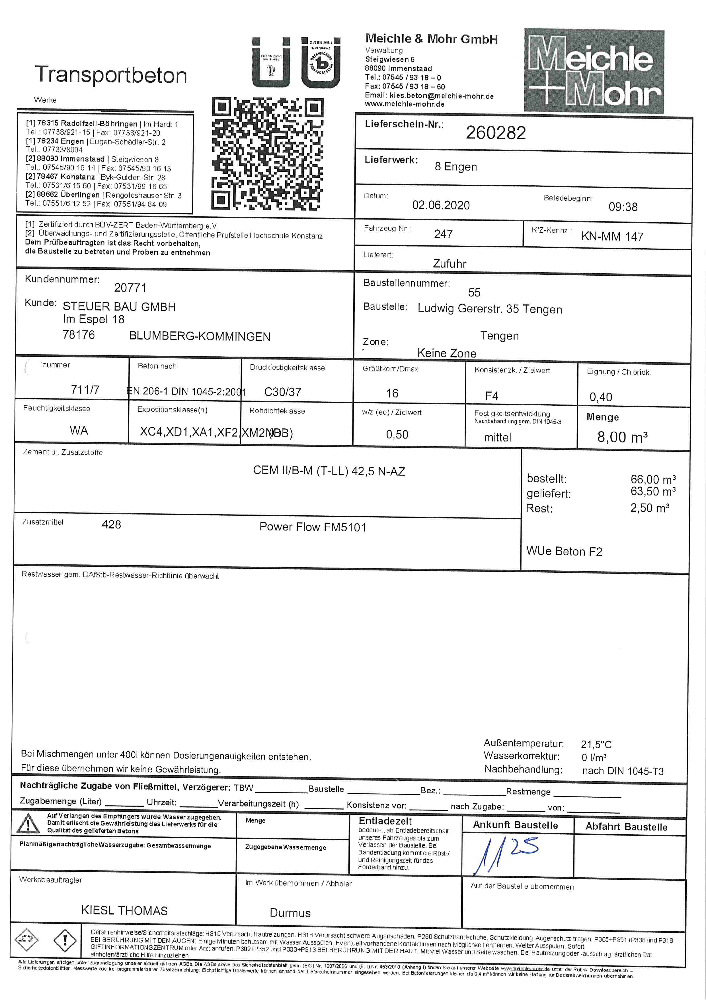

In [4]:
#example_img_path = Path("/work/lieferscheine/7800049300_20210324_160924_0006.jpg")
example_img_path = data_path/"7800049300_20210324_160301_0032.jpg"
im = Image.open(example_img_path)
display(im)

In [5]:
#!pip install opencv-python==4.5.1.4

In [6]:
import cv2
import numpy as np
import pytesseract

In [7]:
image = cv2.imread(str(example_img_path))

In [8]:
from matplotlib import pyplot as plt
def display_cv_img(img):
    plt.rcParams["figure.figsize"] = (15, 15)
    plt.imshow(img, cmap='Greys_r')
    
    plt.show()

In [9]:
def pipeline(image):
    image_resized = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
    gray = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 230, 255, cv2.THRESH_BINARY_INV)

    return thresh

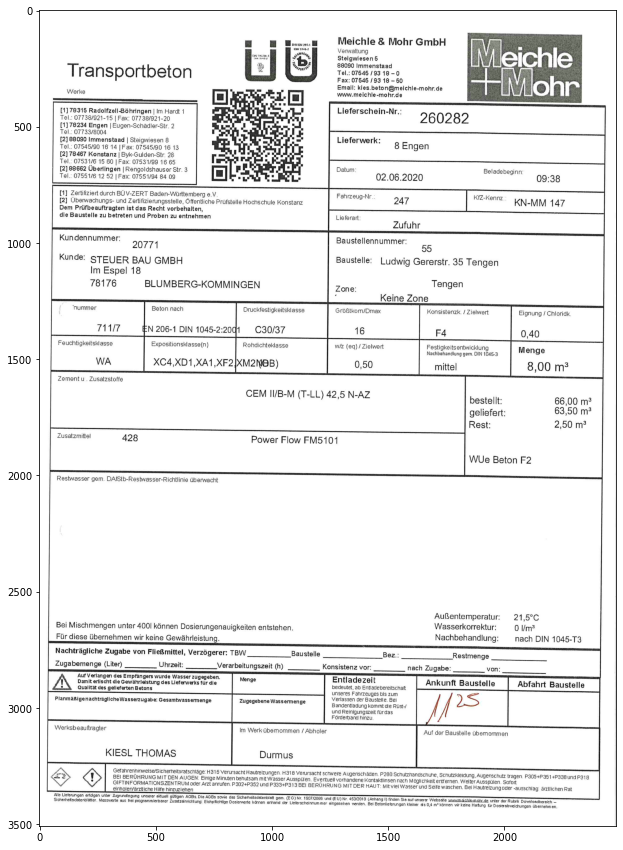

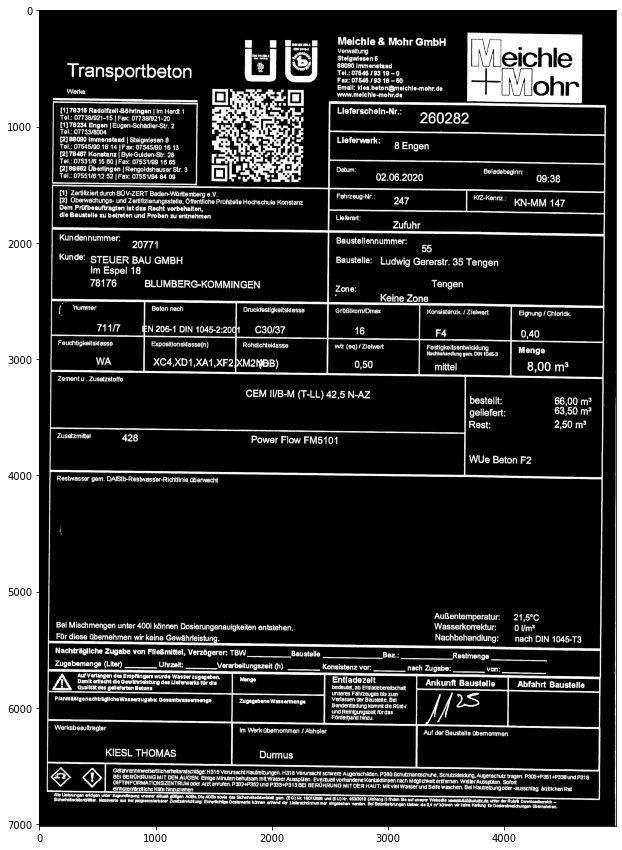

In [10]:
display_cv_img(image)
pipelined_img = pipeline(image)
display_cv_img(pipelined_img)

In [11]:
import math
def extractLines(img):
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Detect horizontal lines
    horizontal_lines = []

    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (40,1))
    detect_horizontal = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
    cnts = cv2.findContours(detect_horizontal, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        #img = cv2.drawContours(img, [c], -1, (36,255,12), 2)
        x_min = np.inf
        x_max = 0
        y_avg = 0
        for point in c:
            x = point[0][0]
            y = point[0][1]
            x_min = min(x_min, x)
            x_max = max(x_max, x)
            y_avg += y
        y_avg /= len(c)
        y_avg = int(y_avg)
        start = (x_min, y_avg)
        end = (x_max, y_avg)
        horizontal_lines.append((start, end))
        #img = cv2.line(img, (x_min, y_avg), (x_max, y_avg), (36,255,12), 10)
    
    # Detect vertical lines
    vertical_lines = []
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1,40))
    detect_vertical = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
    cnts = cv2.findContours(detect_vertical, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        img = cv2.drawContours(img, [c], -1, (36,255,12), 2)
        y_min = np.inf
        y_max = 0
        x_avg = 0
        for point in c:
            y = point[0][1]
            x = point[0][0]
            y_min = min(y_min, y)
            y_max = max(y_max, y)
            x_avg += x
        x_avg /= len(c)
        x_avg = int(x_avg)
        start = (x_avg, y_min)
        end = (x_avg, y_max)
        vertical_lines.append((start, end))
    return horizontal_lines, vertical_lines

line_img = image.copy()
horizontal_lines, vertical_lines = extractLines(line_img)

config.yaml?dl=1: 8.19kB [00:01, 5.47kB/s]
model_final.pth?dl=1: 351MB [00:41, 8.52MB/s]                               


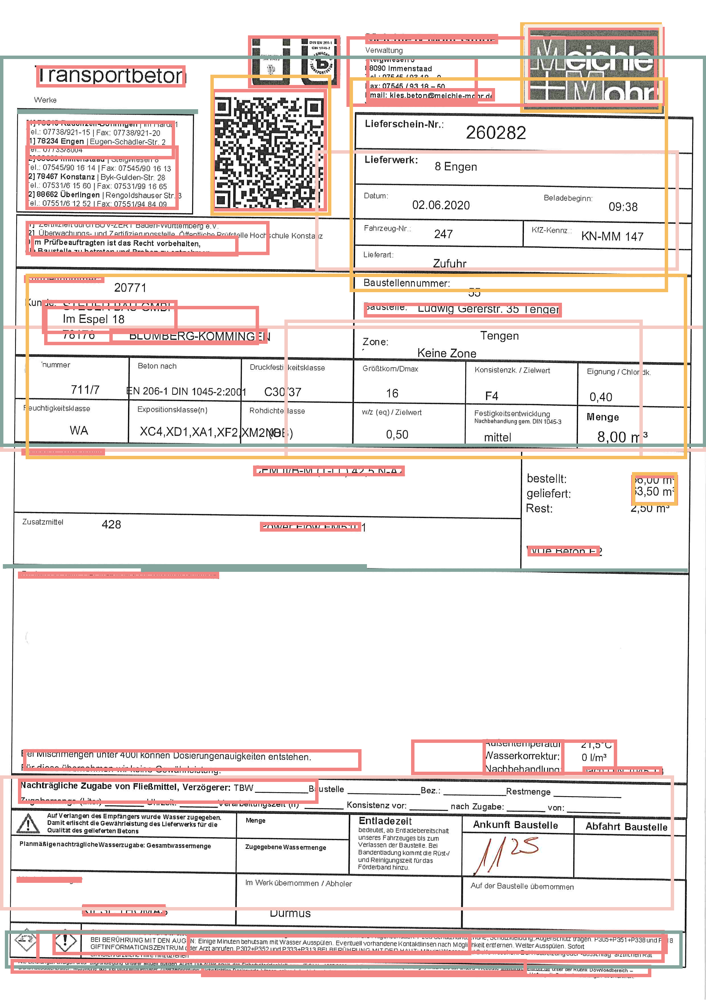

In [12]:
import layoutparser as lp
model = lp.Detectron2LayoutModel('lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config')

layout = model.detect(image)
lp.draw_box(image, layout,)

In [13]:
text_blocks = lp.Layout([b for b in layout if b.type=='TextRegion'])
figure_blocks = lp.Layout([b for b in layout if b.type=='ImageRegion'])
math_blocks = lp.Layout([b for b in layout if b.type=='MathsRegion'])
table_blocks = lp.Layout([b for b in layout if b.type=='TableRegion'])
separator_blocks = lp.Layout([b for b in layout if b.type=='SeparatorRegion'])
other_blocks = lp.Layout([b for b in layout if b.type=='OtherRegion'])

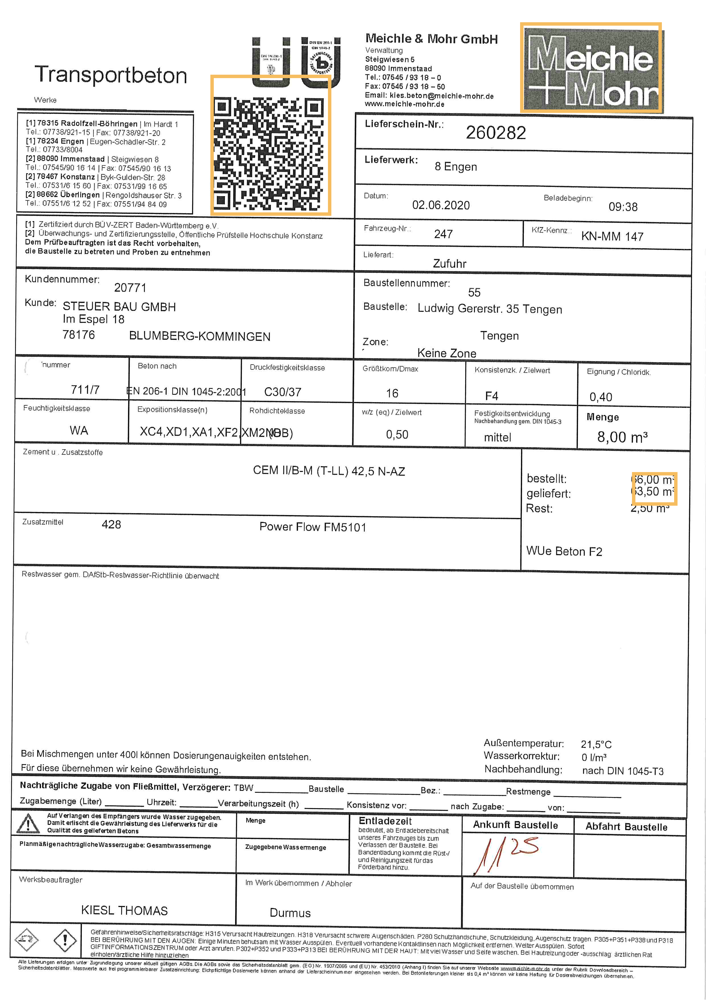

In [14]:
lp.draw_box(image, figure_blocks,)

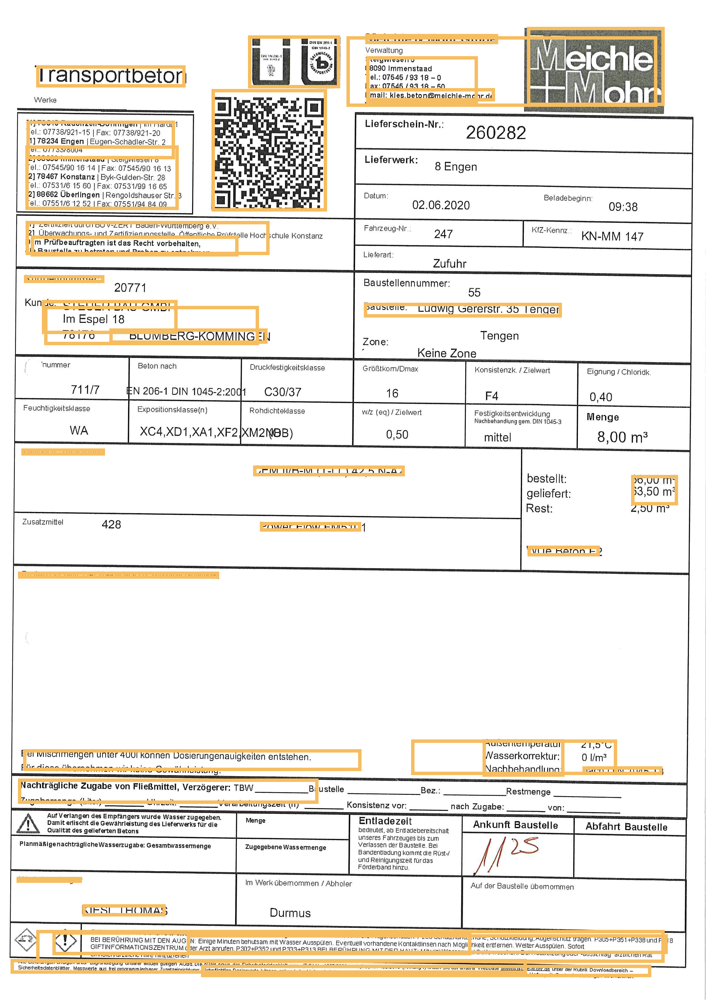

In [15]:
lp.draw_box(image, text_blocks,)

In [16]:
def blacken_rect(img, left, top, end_x, end_y):
    start_point = (left, top)
    end_point = (end_x, end_y)
    cv2.rectangle(img, start_point, end_point, (0, 0, 0), -1)

TextBlock(block=Rectangle(x_1=1827.02001953125, y_1=78.12899017333984, x_2=2324.32861328125, y_2=395.575927734375), text=None, id=None, type=ImageRegion, parent=None, next=None, score=0.5281247496604919)
TextBlock(block=Rectangle(x_1=739.8179931640625, y_1=262.4726867675781, x_2=1163.9853515625, y_2=756.5108032226562), text=None, id=None, type=ImageRegion, parent=None, next=None, score=0.0649183988571167)
TextBlock(block=Rectangle(x_1=2220.0791015625, y_1=1656.21630859375, x_2=2379.99951171875, y_2=1773.226318359375), text=None, id=None, type=ImageRegion, parent=None, next=None, score=0.06114744022488594)


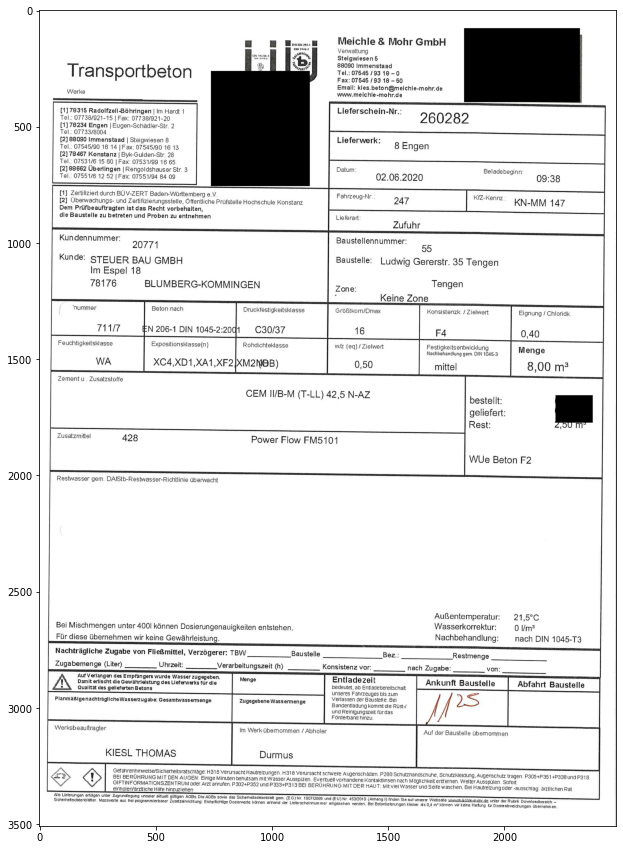

In [17]:
img_copy = image.copy()
for fig in figure_blocks:
    start_point = (int(fig.block.x_1), int(fig.block.y_1))
    end_point = (int(fig.block.x_2), int(fig.block.y_2))
    blacken_rect(img_copy, start_point[0], start_point[1], end_point[0], end_point[1])
    print(fig)
display_cv_img(img_copy)

In [30]:
from io import StringIO
import pandas as pd

pipelined_img = pipeline(img_copy)
img_rgb = cv2.cvtColor(pipelined_img, cv2.COLOR_BGR2RGB)
tess_data = StringIO(pytesseract.image_to_data(img_rgb))
df = pd.read_csv(tess_data, sep='\t')

img_height, img_width, _ = img_rgb.shape

In [31]:
df = df.replace(r'^\s*$', np.nan, regex=True)
block_counts = df.groupby('block_num')['text'].count()
non_empty_blocks = block_counts[block_counts > 0].index
df_filled_blocks = df[df.block_num.isin(non_empty_blocks)]

In [32]:
def extract_pars(block_frame):
    pars = block_frame.par_num.unique()
    par_list = []
    for par in pars:
        par_list.append(block_frame[block_frame.par_num == par])
    return par_list

def extract_lines(par_frame):
    lines = par_frame.line_num.unique()
    line_list = []
    for line in lines:
        line_list.append(par_frame[par_frame.line_num == line])
    return line_list

In [33]:
import re

def line_to_text(line_frame):
    return ' '.join(line_frame.text)

def postprocess_text(text):
    processed = text.lower()
    #print(text.split())
    processed = re.sub(r'[^A-Za-z0-9 ]+', '', processed)
    return processed

def get_block(dframe, num):
    return dframe[dframe.block_num == num]

def rows_to_rect(frame):
    if len(frame) <= 0:
        return (0, 0, 0, 0)
    min_left = np.inf
    min_top = np.inf
    max_left = 0
    max_top = 0
    for _, row in frame.iterrows():
        start_point = (row.left, row.top)
        end_point = (start_point[0] + row.width, start_point[1] + row.height)
        if row.width > 0.5 * img_width or row.height > 0.5 * img_height:
            continue
        min_left = min(min_left, start_point[0])
        max_left = max(max_left, end_point[0])
        min_top = min(min_top, start_point[1])
        max_top = max(max_top, end_point[1])
    if min_left == np.inf or min_top == np.inf or max_left == 0 or max_top == 0:
        return (0, 0, 0, 0)
    return (min_left, min_top, max_left, max_top)

def add_2_blocks_func(dframe, line):
    block_num = line.block_num.iloc[0]
    block_1 = get_block(dframe, block_num + 1)
    block_2 = get_block(dframe, block_num + 2)
    return [rows_to_rect(block_1), rows_to_rect(block_2)]

def add_1_blocks_func(dframe, line):
    block_num = line.block_num.iloc[0]
    block_1 = get_block(dframe, block_num + 1)
    return [rows_to_rect(block_1)]

def add_cur_block_func(dframe, line):
    block_num = line.block_num.iloc[0]
    block = get_block(dframe, block_num)
    rect = rows_to_rect(block)
    print(block)
    return [rows_to_rect(get_block(dframe, block_num))]

def add_cur_par_func(dframe, line):
    block_num = line.block_num.iloc[0]
    par_num = line.par_num.iloc[0]
    block = get_block(dframe, block_num)
    par = block[block.par_num == par_num]
    return [rows_to_rect(par)]

def add_cur_line_func(dframe, line_frame):
    return [rows_to_rect(line_frame)]

def keyword_substr(text, keyword):
    return keyword in text

def keyword_isword(text, keyword):
    return keyword in text.split()

def get_blacken_rects(dframe):
    blacken_rects = []
    par_rects = []
    keyword_funcs = [('kunde', keyword_substr, add_2_blocks_func), 
                    ('telefon', keyword_isword, add_cur_line_func),
                    ('telefax', keyword_isword, add_cur_line_func),
                    ('fax', keyword_isword, add_cur_line_func),
                    ('tel', keyword_isword, add_cur_line_func),
                    ('fahrzeug', keyword_isword, add_1_blocks_func),
                    ('gmbh', keyword_isword, add_cur_block_func),]
    block_nums = dframe.block_num.unique()
    for block_num in block_nums:
        cur_block = get_block(dframe, block_num)
        pars = extract_pars(cur_block)
        for par in pars:
            par_rects.append(rows_to_rect(par))
            lines = extract_lines(par)
            for line in lines:
                line = line[line.text.notna()]
                text = line_to_text(line)
                text = postprocess_text(text)
                for keyword, keyword_check, func in keyword_funcs:
                    if keyword_check(text, keyword):
                        blacken_rects += func(dframe, line)                
    return blacken_rects, par_rects

get_blacken_rects(df_filled_blocks)

    level  page_num  block_num  par_num  line_num  word_num  left  top  width  \
8       2         1          2        0         0         0  2560  233    937   
9       3         1          2        1         0         0  2562  233    935   
10      4         1          2        1         1         0  2572  233    925   
11      5         1          2        1         1         1  2572  233    319   
12      5         1          2        1         1         2  2915  237     59   
13      5         1          2        1         1         3  3007  237    209   
14      5         1          2        1         1         4  3234  241    263   
15      4         1          2        1         2         0  2562  330    270   
16      5         1          2        1         2         1  2562  330     66   
17      5         1          2        1         2         2  2632  332    200   
18      3         1          2        2         0         0  2568  393    344   
19      4         1         

([(2560, 233, 3497, 752),
  (2564, 514, 3100, 581),
  (182, 898, 1125, 962),
  (182, 898, 1125, 962),
  (181, 1022, 1103, 1092),
  (179, 1144, 1201, 1224),
  (179, 1144, 1201, 1224),
  (178, 1273, 1172, 1342),
  (178, 1273, 1172, 1342),
  (177, 1398, 1172, 1463),
  (177, 1398, 1172, 1463),
  (2548, 2016, 3947, 2222),
  (0, 0, 0, 0),
  (2548, 2016, 3947, 2222),
  (0, 0, 0, 0),
  (177, 1927, 1898, 2400)],
 [(2560, 233, 3497, 752),
  (2562, 233, 3497, 385),
  (2568, 393, 2912, 452),
  (2560, 450, 3088, 518),
  (2564, 514, 3100, 581),
  (2562, 580, 3179, 646),
  (2560, 640, 3468, 752),
  (1770, 257, 2398, 333),
  (1770, 257, 2398, 333),
  (2187, 320, 2319, 352),
  (2187, 316, 2319, 362),
  (1835, 380, 1984, 432),
  (1835, 376, 1984, 432),
  (243, 457, 1312, 611),
  (243, 457, 1312, 611),
  (239, 679, 400, 723),
  (239, 674, 400, 723),
  (0, 0, 0, 0),
  (177, 832, 3116, 1463),
  (3264, 879, 3695, 979),
  (3264, 879, 3695, 979),
  (2565, 1087, 3349, 1215),
  (2565, 1087, 3349, 1215),
  (2559

    level  page_num  block_num  par_num  line_num  word_num  left  top  width  \
8       2         1          2        0         0         0  2560  233    937   
9       3         1          2        1         0         0  2562  233    935   
10      4         1          2        1         1         0  2572  233    925   
11      5         1          2        1         1         1  2572  233    319   
12      5         1          2        1         1         2  2915  237     59   
13      5         1          2        1         1         3  3007  237    209   
14      5         1          2        1         1         4  3234  241    263   
15      4         1          2        1         2         0  2562  330    270   
16      5         1          2        1         2         1  2562  330     66   
17      5         1          2        1         2         2  2632  332    200   
18      3         1          2        2         0         0  2568  393    344   
19      4         1         

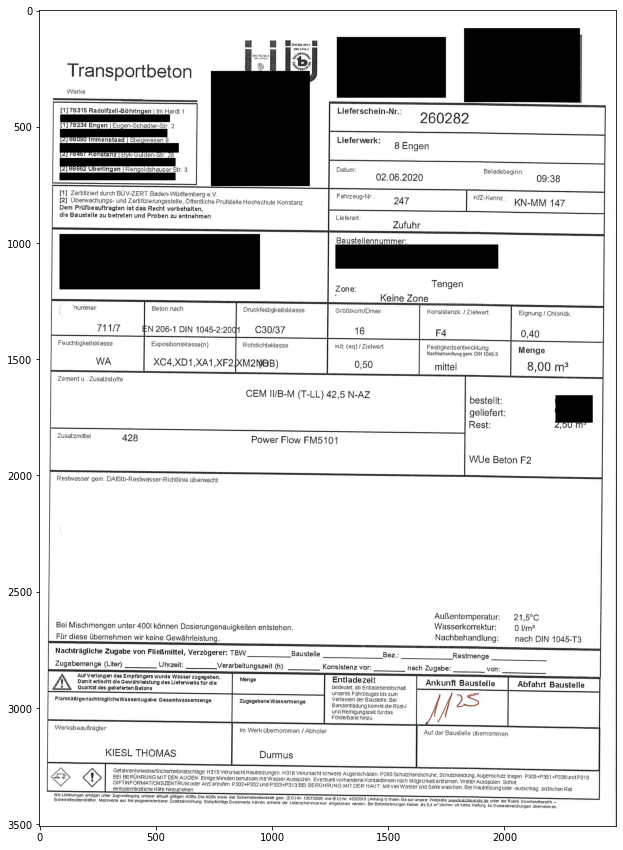

In [34]:
blacken_rects, par_rects = get_blacken_rects(df_filled_blocks)
img_processed = img_copy.copy()
for rect in blacken_rects:
    blacken_rect(img_processed, int(rect[0]/2), int(rect[1]/2), int(rect[2]/2), int(rect[3]/2))
"""
for rect in par_rects:
    start_point = (int(rect[0]/2), int(rect[1]/2))
    end_point = (int(rect[2]/2), int(rect[3]/2))
    cv2.rectangle(img_processed, start_point, end_point, (0, 255, 0), 1)
"""
display_cv_img(img_processed)

In [35]:

def contained_horizontal(line, rect):
    return rect[0][0] < line[1][0] and rect[1][0] > line[0][0]

def contained_vertical(line, rect):
    return rect[0][1] < line[1][1] and rect[1][1] > line[0][1]

h_line_idxs = []
v_line_idxs = []
for _, row in df_filled_blocks.iterrows():
    rect_start = (int(row.left / 2), int(row.top) / 2)
    rect_end = (int((row.left + row.width) / 2), int((row.top + row.height)/2))
    rect = (rect_start, rect_end)
    h_y_max = 0
    h_line_max_idx = None
    for i, line in enumerate(horizontal_lines):
        y = line[0][1]
        if contained_horizontal(line, rect) and y < rect_end[1] and y > h_y_max:
            h_y_max = y
            h_line_max_idx = i
    h_line_idxs.append(h_line_max_idx)

    v_x_max = 0
    v_line_max_idx = None
    for i, line in enumerate(vertical_lines):
        x = line[0][0]
        if contained_vertical(line, rect) and x < rect_end[0] and x > v_x_max:
            v_x_max = x
            v_line_max_idx = i
    v_line_idxs.append(v_line_max_idx)
df_filled_blocks['h_line_idx'] = h_line_idxs
df_filled_blocks['v_line_idx'] = v_line_idxs
#df_filled_blocks[df_filled_blocks.h_line_idx == 54]
df_filled_blocks[df_filled_blocks.text == 'Konstanz']
df_filled_blocks[df_filled_blocks.h_line_idx == 32]
#df_filled_blocks[df_filled_blocks.h_line_idx == 31]
    #print(row)

<ipython-input-35-d149bcb73693>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filled_blocks['h_line_idx'] = h_line_idxs
<ipython-input-35-d149bcb73693>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filled_blocks['v_line_idx'] = v_line_idxs


,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text,h_line_idx,v_line_idx
136,5,1,17,1,1,1,185,835,64,55,32,R,32.0,16.0
137,5,1,17,1,1,2,408,832,110,68,17,T,32.0,16.0
138,5,1,17,1,1,3,531,840,309,56,0,R,32.0,16.0
139,5,1,17,1,1,4,886,848,325,55,7,AT,32.0,16.0
140,5,1,17,1,1,5,1231,850,14,46,13,g,32.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,5,1,17,1,10,4,659,1408,11,55,88,|,32.0,16.0
206,5,1,17,1,10,5,683,1409,101,47,83,Fax:,32.0,16.0
207,5,1,17,1,10,6,800,1408,222,48,91,07551/94,32.0,16.0
208,5,1,17,1,10,7,1039,1408,58,51,96,84,32.0,16.0


In [36]:
def add_form_rect(dframe, line):
    h_line = line.h_line_idx.iloc[0]
    v_line = line.v_line_idx.iloc[0]
    if not h_line or not v_line:
        return []
    rect_rows = dframe[(dframe.h_line_idx == h_line) & (dframe.v_line_idx == v_line)]
    #print(rect_rows)
    return [rows_to_rect(rect_rows)]

def get_blacken_rects_new(dframe):
    blacken_rects = []
    keyword_funcs = [('tel', keyword_isword, add_form_rect),
                    ('kunde', keyword_isword, add_form_rect)]
    block_nums = dframe.block_num.unique()
    for block_num in block_nums:
        cur_block = get_block(dframe, block_num)
        pars = extract_pars(cur_block)
        for par in pars:
            par_rects.append(rows_to_rect(par))
            lines = extract_lines(par)
            for line in lines:
                line = line[line.text.notna()]
                text = line_to_text(line)
                text = postprocess_text(text)
                for keyword, keyword_check, func in keyword_funcs:
                    if keyword_check(text, keyword):
                        blacken_rects += func(dframe, line)                
    return blacken_rects

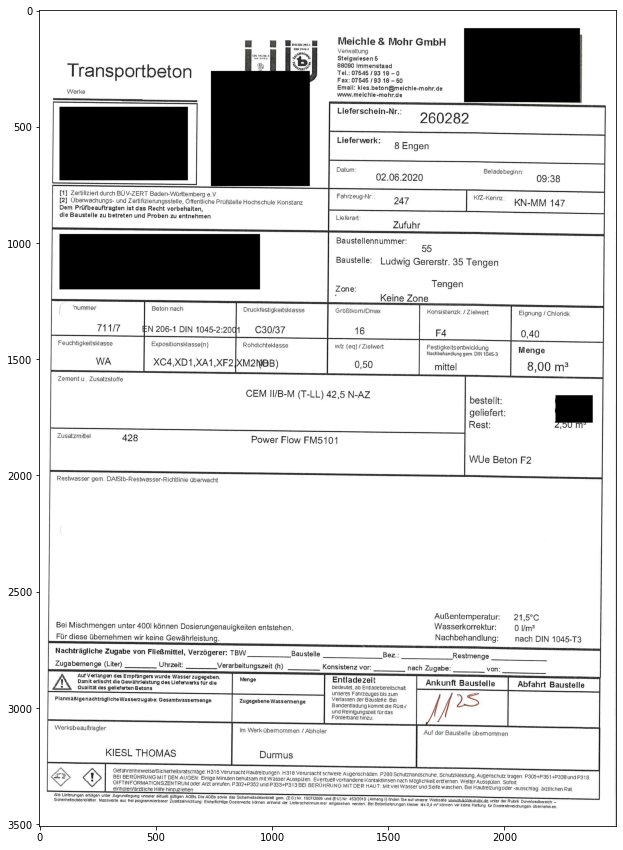

In [37]:
new_blacken_img = img_copy.copy()
blacken_rects = get_blacken_rects_new(df_filled_blocks)
for rect in blacken_rects:
    blacken_rect(new_blacken_img, int(rect[0]/2), int(rect[1]/2), int(rect[2]/2), int(rect[3]/2))
display_cv_img(new_blacken_img)

In [38]:
' '.join(df_filled_blocks.text[df_filled_blocks.text.notna()])

"Meichle & Mohr GmbH AL By} S W LT 88090 Immenstaad Tel.: 07646 /9318 -0 kLSRR SRR Emall: kies.beton@melchle-mohr.de www.meichle-mohr.de B B DU LR LT X R T 2 (LRSS Transportbeton MYy R T R AT g Lieferschein-Nr.: Tel.: 07738/921-15 | Fax; 07738/921-20 [1178234 Engen | Eugen-Schadler-Str. 2 Tel.: 07733/8004 . | _ [2]188030 Immenstaad | Steigwiesen 8 Tel.: 07545/90 16 14 | Fax: 07545/90 16 13 [2] 78467 Konstanz | Byk-Guiden-Str. 28 Tel.; 0753176 15 60 | Fax: 0753/99 16 65 [2] 88662 Uberlingen | Rengoldshauser Str. 3 Tel.: 07551/6.12 52 | Fax: 07551/94 84 09 260282 RS TR 1 ) gen Datum: Beladebeginn: 02.06.2020 eie et [1] Zertifiziert durch BUV-ZERT Baden-Warttemberge.V. [2] Oberwachungs- und Zertifizierungsstelle, Offentliche Prafstelle Hochschule Konstanz Dem Prifbeauftragten ist das Recht vorbehalten, die Baustelle zu betreten und Proben zu entnehmen A A Fahrzeug-Nr.: YN KN-MM 147 [T Zufuhr Baustellennummer: Kundennummer: Y a e Kunde: STEUER BAU GMBH Im Espel 18 78176 BLUMBERG-KOMMINGEN 

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1c3e9a8c-9b20-42e7-b6ba-2bd03e1e0bae' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>